<a href="https://colab.research.google.com/github/imrealhelper/Linear-Algebra/blob/main/soft_landing_guidance_Jinwoo_IM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Soft landing guidance

$$
\newcommand{\eg}{{\it e.g.}}
\newcommand{\ie}{{\it i.e.}}
\newcommand{\argmin}{\operatornamewithlimits{argmin}}
\newcommand{\mc}{\mathcal}
\newcommand{\mb}{\mathbb}
\newcommand{\mf}{\mathbf}
\newcommand{\minimize}{{\text{minimize}}}
\newcommand{\diag}{{\text{diag}}}
\newcommand{\cond}{{\text{cond}}}
\newcommand{\rank}{{\text{rank }}}
\newcommand{\range}{{\mathcal{R}}}
\newcommand{\null}{{\mathcal{N}}}
\newcommand{\tr}{{\text{trace}}}
\newcommand{\dom}{{\text{dom}}}
\newcommand{\dist}{{\text{dist}}}
\newcommand{\R}{\mathbf{R}}
\newcommand{\SM}{\mathbf{S}}
\newcommand{\ball}{\mathcal{B}}
\newcommand{\bmat}[1]{\begin{bmatrix}#1\end{bmatrix}}
$$

__<div style="text-align: right"> ASE7030: Convex Optimization, Inha University. </div>__
_<div style="text-align: right"> Jong-Han Kim (jonghank@inha.ac.kr) </div>_
_<div style="text-align: right"> Jiwoo Choi (jiwoochoi@inha.edu) </div>_

<br>

We consider a soft landing problem for a rocket. The particle mass dynamics for each coordinate in ENU (East-North-Up) frame is governed by

$$
\begin{aligned}
  \dot{v_e} &= u_e - \gamma v_e  \\
  \dot{p_e} &= v_e \\  
  \dot{v_n} &= u_n - \gamma v_n  \\
  \dot{p_n} &= v_n \\  
  \dot{v_u} &= u_u - \gamma v_u - g\\
  \dot{p_u} &= v_u
\end{aligned}
$$

Denoting the velocity, position, gravity vector in ENU frame by $v=(v_e,v_n,v_u)$, $p=(p_e,p_n,p_u)$, $g=(0,0,-g)$, the damping coefficient by $\gamma$, the trapezoidal integration assuming constant acceleration during the sampling interval gives,

$$
\begin{aligned}
  v_{t+1} &= v_t + {h}\left( u_t - \gamma v_t -g \right) \\
  &= \left(1-\gamma h\right) v_t + h u_t - hg \\
  p_{t+1} &= p_t + \frac{h}{2}\left( v_t + v_{t+1} \right)  \\
  &= p_t + \frac{h}{2}\left( v_t + \left(1-\gamma h\right) v_t + h u_t \right)  \\
  &= p_t +  \left(h-\frac{1}{2}\gamma h^2\right) v_t + \frac{1}{2} h^2 u_t
\end{aligned}
$$

Then with $x = (p_e,p_n,p_u,v_e,v_n,v_u)$ the above dynamics can be coded into the following:

$$
\begin{aligned}
  x_{t+1} &= Ax_t + Bu_t
\end{aligned}
$$

In other words,

$$
\bmat{p_e \\ p_n \\ p_u \\ v_e \\ v_n \\ v_u }_{t+1} = \underbrace{\bmat{
1 & 0 & 0 & \left(1-0.5\gamma h\right)h & 0 & 0 \\
0 & 1 & 0 & 0 & \left(1-0.5\gamma h\right)h & 0 \\
0 & 0 & 1 & 0 & 0 & \left(1-0.5\gamma h\right)h \\
0 & 0 & 0 & 1-\gamma h & 0 & 0 \\
0 & 0 & 0 & 0 & 1-\gamma h & 0 \\
0 & 0 & 0 & 0 & 0 & 1-\gamma h
}}_{A}
\bmat{p_e \\ p_n \\ p_u \\ v_e \\ v_n \\ v_u}_t + \underbrace{\bmat{
0.5h^2 & 0 & 0 \\
0 & 0.5h^2 & 0 \\
0 & 0 & 0.5h^2 \\
h & 0 & 0 \\
0 & h & 0 \\
0 & 0 & h
}}_{B} \bmat{u_e \\ u_n \\ u_u }_t
+ \underbrace{\bmat{0 \\ 0 \\ -0.5h^2g \\ 0 \\ 0 \\ -hg}}_{b}
$$

The rocket is initially at $x_0 = (500,200,2000,40,-10,-300)$, and we consider a finite horizon of $T=20$ with $N=200$.

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse as ssp
import scipy.sparse.linalg as sla
from scipy.linalg import sqrtm

N = 200 # number of timesteps
T = 20 # time will vary from 0 to T with stepsize h
ts = np.linspace(0,T,N+1)
h = T/N
gamma = .05 # damping, 0 is no damping
g = 9.8

n = 6   # state size
m = 3   # control size

I3 = ssp.eye(3)

A = ssp.bmat([[I3, (1-gamma*h/2)*h*I3], \
              [None,   (1-gamma*h)*I3]])
B = ssp.bmat([[h**2/2*I3], \
              [     h*I3]])
b = np.array([0,0,-0.5*g*h**2,0,0,-g*h])

x_0 = np.array([500,200,2000,40,-10,-300])

<br>

We formulate the soft landing problem via linear quadratic regulator design problem.
With the design parameters $Q_1,\dots,Q_N \ge 0$ and $R_0,\dots,R_{N-1}>0$, the LQR problem can be stated as follows (we can omit the first stage cost term $x_0^TQ_0 x_0$).

$$
\begin{aligned}
  \underset{u,x}{\minimize} \quad & \sum_{t=0}^{N-1} \left( x_t^TQ_tx_t + u_t^TR_tu_t \right) + x_N^TQ_Nx_N \\
  \text{subject to} \quad & x_{t+1} = Ax_t + Bu_t + b, \quad\forall t=0,\dots,N-1,
\end{aligned}
$$

<br>

We define time-varying $Q$ such that
$$
Q_t = \bmat{
10e^{-(N-t)/18} \\
& 10e^{-(N-t)/18} \\
& & 0 \\
& & & 100e^{-(N-t)/18} \\
& & & & 100e^{-(N-t)/18} \\
& & & & & 0
}
$$
for $t=0,\dots,N-1$ along with
$$
Q_N = \bmat{
10 \\
& 10 \\
& & 100 \\
& & & 100 \\
& & & & 100 \\
& & & & & 1000
}
$$

and $R_t=I$ for all $t$.


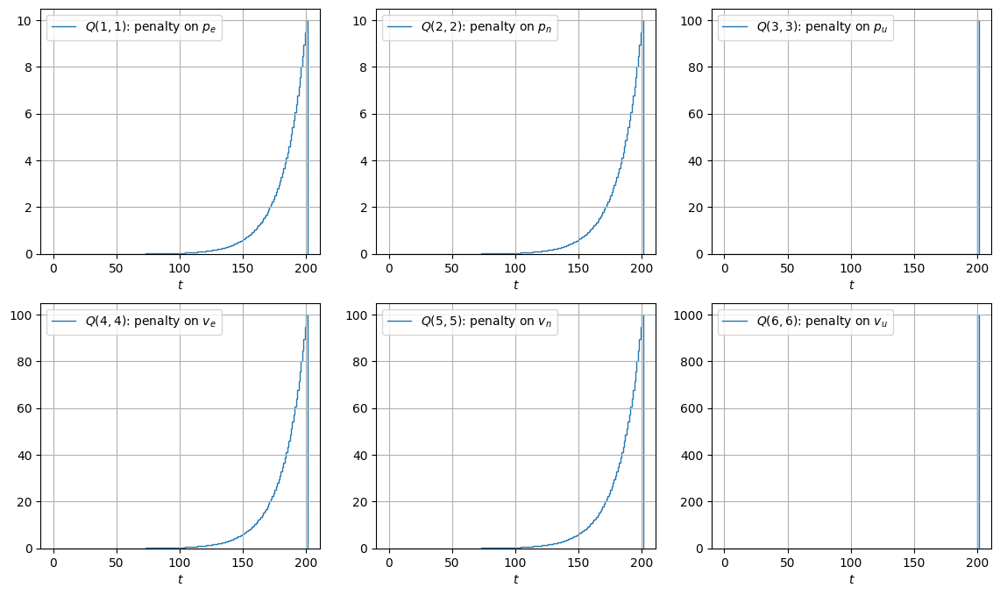

In [34]:
Q = []
R = []
Q_tilde = []
R_tilde = []
for t in range(N):
  Qt = np.exp(-(N-t)/18)*ssp.diags([10,10,  0,100,100,   0])
  Rt = ssp.eye(m)
  Q.append(Qt)
  R.append(Rt)
Q.append(ssp.diags([ 10,10,100,100,100,1000]))

labels = [r'$p_e$',r'$p_n$',r'$p_u$',r'$v_e$',r'$v_n$',r'$v_u$',
          r'$u_e$',r'$u_n$',r'$u_u$']

plt.figure(figsize=(14,8), dpi=100)
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.stairs([q.toarray()[i,i] for q in Q], label=rf'$Q({i+1},{i+1})$: penalty on {labels[i]}')
  plt.legend()
  plt.grid()
  plt.xlabel(r'$t$')
plt.show()

In [35]:
# draw plots
def draw_plots(t1,x1,u1,t2=[],x2=[],u2=[]):
  # t1: time, (N+1,)-vector
  # x1: state trajectory, 6x(N+1) matrix
  # u1: control vector, 3xN matrix
  # t2, x2, u2: optional for comparing two trajectories, size same as above

  labels = [r'$p_e$',r'$p_n$',r'$p_u$',r'$v_e$',r'$v_n$',r'$v_u$',
            r'$u_e$',r'$u_n$',r'$u_u$']
  plt.figure(figsize=(14,9), dpi=100)
  for i in range(6):
    plt.subplot(3,3,i+1)
    plt.plot(t1,x1[i],label=labels[i])
    if len(t2):
      plt.plot(t2,x2[i])
    plt.legend()
    plt.grid()
  for i in range(3):
    plt.subplot(3,3,i+7)
    plt.plot(t1[:-1],u1[i],label=labels[i+6])
    if len(t2):
      plt.plot(t2[:-1],u2[i])
    plt.xlabel(r'$t$')
    plt.legend()
    plt.grid()
  plt.show()
  return

# draw 3D plot
def draw_3d_traj(x1,u1,x2=[],u2=[]):
  # x1: state trajectory, 6x(N+1) matrix
  # u1: control vector, 3xN matrix
  # x2, u2: optional for comparing two trajectories, size same as above

  fig = plt.figure(figsize=(10,10), dpi=100)
  ax  = fig.add_subplot(projection='3d')
  ax.view_init(elev=10, azim=-75, roll=0)
  _ = 10

  N = x1.shape[1]-1
  ax.plot(*x1[:3,:])
  if len(x2):
    ax.plot(*x2[:3,:])
  for i in range(0, N, 10):
    __ = np.linalg.norm(u1[:,i])/200
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],-u1[0,i]*_,-u1[1,i]*_,-u1[2,i]*_, \
              color='magenta', linewidths=1, arrow_length_ratio = 0)
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],u1[0,i]/__,u1[1,i]/__,u1[2,i]/__, \
              color='gray', linewidths=1, arrow_length_ratio = 0)
    if len(x2):
      __ = np.linalg.norm(u2[:,i])/200
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],-u2[0,i]*_,-u2[1,i]*_,-u2[2,i]*_, \
                color='red', linewidths=1, arrow_length_ratio = 0)
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],u2[0,i]/__,u2[1,i]/__,u2[2,i]/__, \
                color='black', linewidths=1, arrow_length_ratio = 0)

  th = np.linspace(0,2*np.pi)
  ax.plot(100*np.cos(th),100*np.sin(th),0,alpha=0.5,color='green')
  ax.plot(200*np.cos(th),200*np.sin(th),0,alpha=0.5,color='green')
  ax.set_xlabel(r'$p_e$')
  ax.set_ylabel(r'$p_n$')
  ax.set_zlabel(r'$p_u$')
  ax.axis('equal')
  plt.show()
  return

In [36]:
# make 3D animation
!pip install celluloid

from celluloid import Camera
from matplotlib import rc

def make_3d_anim(x1,u1,x2=[],u2=[],playback_speed=2):
  # x1: state trajectory, 6x(N+1) matrix
  # u1: control vector, 3xN matrix
  # x2, u2: optional for comparing two trajectories, size same as above

  fig = plt.figure(figsize=(10,10), dpi=100)
  ax = fig.add_subplot(projection='3d')
  ax.view_init(elev=10, azim=-75, roll=0)
  _ = 10

  N = x1.shape[1]-1
  camera = Camera(fig)
  for i in range(0,N,playback_speed):
    ax.plot(*x1[:3,:], alpha=0.2)
    if len(x2):
      ax.plot(*x2[:3,:], alpha=0.2)
    __ = np.linalg.norm(u1[:,i])/200
    ax.plot(x1[0,:i+1],x1[1,:i+1],x1[2,:i+1])
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],-u1[0,i]*_,-u1[1,i]*_,-u1[2,i]*_, \
              color='magenta', linewidths=2, arrow_length_ratio = 0)
    ax.quiver(x1[0,i],x1[1,i],x1[2,i],u1[0,i]/__,u1[1,i]/__,u1[2,i]/__, \
              color='gray', linewidths=4, arrow_length_ratio = 0)
    if len(x2):
      __ = np.linalg.norm(u2[:,i])/200
      ax.plot(x2[0,:i+1],x2[1,:i+1],x2[2,:i+1])
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],-u2[0,i]*_,-u2[1,i]*_,-u2[2,i]*_, \
                color='red', linewidths=2, arrow_length_ratio = 0)
      ax.quiver(x2[0,i],x2[1,i],x2[2,i],u2[0,i]/__,u2[1,i]/__,u2[2,i]/__, \
                color='black', linewidths=4, arrow_length_ratio = 0)

    th = np.linspace(0,2*np.pi)
    ax.plot(100*np.cos(th),100*np.sin(th),0,alpha=0.5,color='green')
    ax.plot(200*np.cos(th),200*np.sin(th),0,alpha=0.5,color='green')
    ax.set_xlabel(r'$p_e$')
    ax.set_ylabel(r'$p_n$')
    ax.set_zlabel(r'$p_u$')
    ax.axis( 'equal')

    camera.snap()

  plt.close()
  anim = camera.animate(blit=False, interval=100)
  rc('animation', html='jshtml')
  return anim

<br>

## Soft landing LQR by least squares

_**(Problem 1)**_ Find the optimal maneuver acceration for the above LQR problem via least squares solutions. Report the terminal position and the terminal velocity at touchdown.

##1. Minimize 문제 변형
Minimize 문제는 아래와 같이 $r$라는 변수를 정의하여 바꿀 수 있다.

$$
\mathbf{r} = \begin{bmatrix}
x_1 \\
x_2 \\
\vdots \\
x_N \\
u_0 \\
u_1 \\
\vdots \\
u_{N-1}
\end{bmatrix} =
\begin{pmatrix} X \\ U \end{pmatrix}
$$

$$
X = \begin{bmatrix} x_1 \\ x_2 \\ \vdots \\ x_N \end{bmatrix}, \quad
U = \begin{bmatrix} u_0 \\ u_1 \\ \vdots \\ u_{N-1} \end{bmatrix}
$$



이때 위의 $
\sum_{t=0}^{N-1} \left( x_t^T Q_t x_t + u_t^T R_t u_t \right) + x_N^T Q_N x_N
$ 문제는 아래와 같이 기술될 수 있다.


$$
\left\|
\begin{bmatrix}
\sqrt{Q_1} & & & & \\
& \sqrt{Q_2} & & & \\
& & \ddots & & \\
& & & \sqrt{Q_N} & \\
& & & & \sqrt{R_0} \\
& & & & & \sqrt{R_1} \\
& & & & & & \ddots \\
& & & & & & & \sqrt{R_{N-1}}
\end{bmatrix}
\begin{bmatrix}
x_1 \\
x_2 \\
\vdots \\
x_N \\
u_0 \\
u_1 \\
\vdots \\
u_{N-1}
\end{bmatrix}
\right\|_2^2
$$

이때 위의 r앞에 곱해진 행렬을 $BLO$라 정의하였다. $BLO$행렬은 대각행렬이 대각방향으로 배치되어있는 블록행렬이면서, 대각행렬이므로 Sparse하다.

##2. 제약조건 변형

$$
\text{subject to} \quad x_{t+1} = Ax_t + Bu_t + b, \quad \forall \, t = 0, \dots, N-1
$$
 라는 제약조건은


$$
\text{S.t.} \quad
\begin{bmatrix}
x_1 \\
x_2 \\
\vdots \\
x_N
\end{bmatrix} =
\underbrace{
\begin{bmatrix}
O & O & \cdots & O \\
A & O & \cdots & O \\
O & A & \cdots & O \\
\vdots & \vdots & \ddots & \vdots \\
O & O & \cdots & A
\end{bmatrix}}_{K}
\begin{bmatrix}
x_1 \\
x_2 \\
\vdots \\
x_N
\end{bmatrix} +
\underbrace{
\begin{bmatrix}
B & O & \cdots & O \\
O & B & \cdots & O \\
\vdots & \vdots & \ddots & \vdots \\
O & O & \cdots & B
\end{bmatrix}}_{Z}
\begin{bmatrix}
u_0 \\
u_1 \\
\vdots \\
u_{N-1}
\end{bmatrix} +
\underbrace{
\begin{bmatrix}
A x_0 + b \\
b \\
\vdots \\
b
\end{bmatrix}}_{q}$$

는 $r$에 대해 다시 표현하면
$$
\text{s.t.} \quad
\underbrace{\begin{bmatrix} I - K & -Z \end{bmatrix}}_{CONT\_FIN}
\begin{bmatrix}
x_1 \\
x_2 \\
\vdots \\
x_N \\
u_0 \\
u_1 \\
\vdots \\
u_{N-1}
\end{bmatrix} =
\begin{bmatrix}
| \\
q \\
|
\end{bmatrix}
$$

##3. KKT 조건사용

이 문제는


$$\min \|Ax\|^2 \quad \text{subject to} \quad Bx = d$$

와 같은 문제이다.

단 여기에서 $A$는 $BLO$행렬이며, $B$는 $CONF\_FIN$ 이며 $d$는 $q$이다.


이때 이러한 문제는 KKT 조건을 이용하여 풀 수 있다.


위 함수의 라그랑지안은 아래와 같다.

$$\mathcal{L}(x, \lambda) = x^T A^T A x + \lambda^T (Bx - d)$$

라그랑지안을 각 변수에 대해서 미분하면

$$\begin{bmatrix} 2A^T A & B^T \\ B & O \end{bmatrix}
\begin{bmatrix} x \\ \lambda \end{bmatrix} =
\begin{bmatrix} 0 \\ d \end{bmatrix}$$

와 같은 선형 방정식을 만족해야 한다.

이때 코드에서는

$$\text{FIN_LEFT} = \begin{bmatrix} 2A^T A & B^T \\ B & O \end{bmatrix}$$
라 정의하였고

$$\text{FIN_RIGHT} = \begin{bmatrix} 0 \\ d \end{bmatrix}$$라 정의하였다.

이때 위 시스템은 역행렬 연산이 없는, Square한 선형 방정식이면서 Sparse하므로, 속도가 빨라짐을 기대해볼 수 있다.

In [37]:
##################
# your code here

# formulation
##################
# your code here


def SOFT_LANDING_LSTSQ(Q,R,A,B, b,x_0):
  #Q와 R에 root를 씌운 것. 이는 Q와 R이 모든 대각원소가 양수인 대각행렬이므로, root를 씌워 분해하는 것이 가능함
  sq_Q = [np.sqrt(q) for q in Q]
  sq_R = [np.sqrt(r) for r in R]
  #BLO라는 블록 행렬을 만듬.
  BLO = ssp.block_diag(sq_Q[1:] +sq_R)
  #Z라는 블록행렬
  Z = ssp.block_diag([B]*N)
  #K라는 블록행렬
  K = np.zeros([6*N,6*N])
  for i in range(N-1):
    K[6*(i+1):6*(i+2),6*i:6*(i+1)] = A.toarray()
  K = ssp.csr_matrix(K)
  #q라는 블록 벡터
  q = np.ones(len(b)*N)
  for i in range(N):
    q[6*i:6*(i+1)] = b
  q[:6] = A@x_0 +b
  CONT1 = ssp.eye(6*N) - K
  CONT2 = -Z
  #CONT_FIN이라는 블록행렬
  CONT_FIN = ssp.hstack([CONT1,CONT2])
  #KKT 조건에 사용되는 FIN_LEFT
  FIN_LEFT = ssp.block_array([[2*BLO.T@BLO, CONT_FIN.T],[CONT_FIN,None]]).tocsr()
  #KKT 조건에 사용되는 FIN_RIGHT
  FIN_RIGHT = np.zeros(3000)
  FIN_RIGHT[3000-len(b)*N:] = q
  FIN_RIGHT= ssp.csr_matrix(FIN_RIGHT)
  #KKT 조건 solve(이때 ssp.linalg.spsolve를 이용)
  X = ssp.linalg.spsolve(FIN_LEFT,FIN_RIGHT.T)
  opt_x = X[:6*N]
  opt_u = X[6*N:9*N]
  opt_x = np.hstack([x_0,opt_x])
  #차원 변환
  x_ls = np.zeros([6,N+1])
  u_ls = np.zeros([3,N])
  for i in range(N+1):
    x_ls[0,i] = opt_x[6*i]
    x_ls[1,i] = opt_x[6*i+1]
    x_ls[2,i] = opt_x[6*i+2]
    x_ls[3,i] = opt_x[6*i+3]
    x_ls[4,i] = opt_x[6*i+4]
    x_ls[5,i] = opt_x[6*i+5]
    if i != N:
      u_ls[0,i] = opt_u[3*i]
      u_ls[1,i] = opt_u[3*i+1]
      u_ls[2,i] = opt_u[3*i+2]
  return x_ls,u_ls

x_ls,u_ls = SOFT_LANDING_LSTSQ(Q,R,A,B, b,x_0)
print(f"terminal position: {x_ls[:3,-1]}")
print(f"terminal velocity: {x_ls[3:,-1]}")

# solution


# simulation


# your code here
##################

terminal position: [ 0.06401034  0.0114091  -0.17587069]
terminal velocity: [-0.00075494 -0.00013456 -0.10731695]


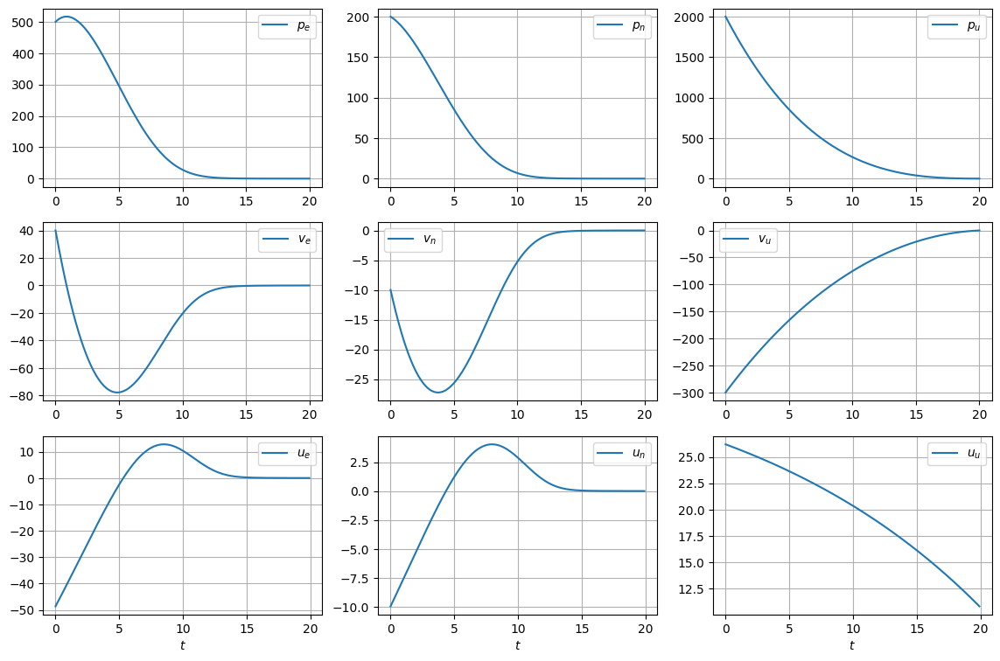

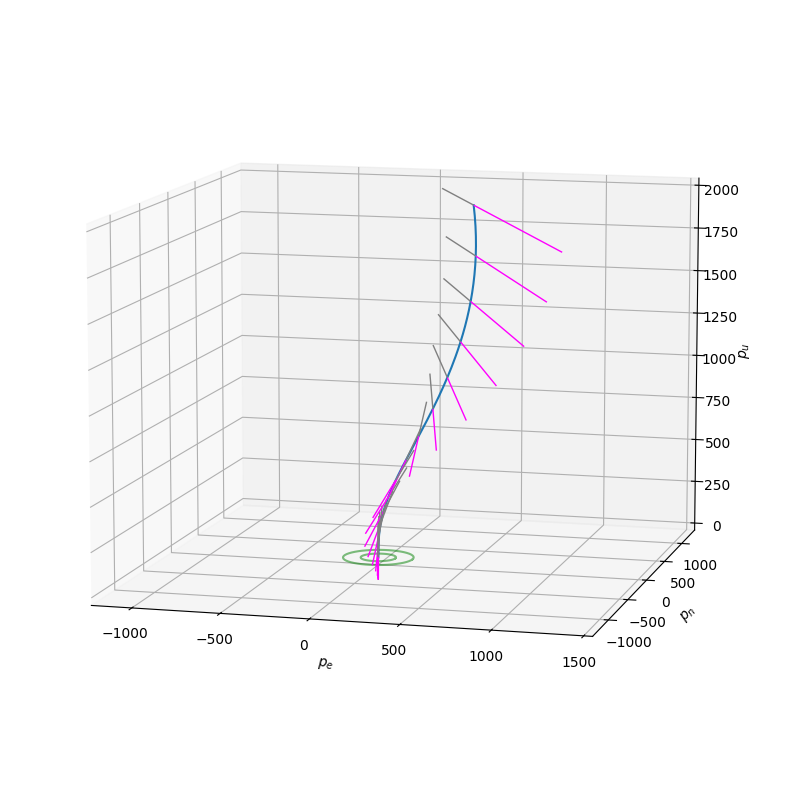

In [38]:
# draw plots
draw_plots(ts,x_ls,u_ls)
draw_3d_traj(x_ls,u_ls)

In [39]:
# make 3D animation
make_3d_anim(x_ls,u_ls,playback_speed=2)